The intention for t

#### **1) Libraries**

In [1]:
# !pip install -U tensorflow_probability -q

In [2]:
# prerequisites
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
# import seaborn as sns
# sns.set()
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, InputLayer, Lambda, Reshape, Dropout, \
                                    Flatten, Dense, Conv2D, Conv2DTranspose  
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import tensorflow_probability as tfp
from tensorflow_probability import distributions
# from tensorflow_probability.distributions import MultivariateStudentTLinearOperator
# from keras import objectives
from scipy.stats import norm



#### **2) MNIST Data**

Load the MNIST dataset

In [3]:
(X_train, y_train), (X_test, y_test) = mnist.load_data()

Preprocess image

In [4]:
def preprocess_images(images):
    # Shape it as (n, 784,)
    images = images.astype('float32') / 255.
    return images.reshape(images.shape[0], -1)

In [5]:
X_train = preprocess_images(X_train)
X_test = preprocess_images(X_test)
X_train.shape, X_test.shape

((60000, 784), (10000, 784))

#### **3) Model Class**

In [6]:
class CoupledVAE:
    def __init__(self, coupling_dist, coupling_loss, train_dim, z_dim, seed,
                 batch_size=100, n_hidden=1024, dropout=0.05, learning_rate=1e-3,
                 initializer=keras.initializers.VarianceScaling(scale=0.1, mode='fan_in', distribution='normal')
                 ):
        """Convolutional variational autoencoder."""
        # Seed
        np.random.seed(seed)
        tf.random.set_seed(seed)
        # Global variables
        self.coupling_dist = coupling_dist
        self.coupling_loss = coupling_loss
        self.z_dim = z_dim
        self.batch_size = batch_size
        self.n_hidden = n_hidden
        self.dropout = dropout
        self.initializer = initializer
        # Encoder
        x = Input(shape=train_dim)
        self.encoder = self._build_encoder_network()  # VAEEncoder
        x_encoded = self.encoder(x)
        # Latent vector
        z = self._get_latent_vector(x_encoded)
        # Decoder
        self.decoder = self._build_decoder_network(train_dim)  # VAEDecoder
        y = self.decoder(z)
        y = tf.clip_by_value(y, 1e-8, 1 - 1e-8)
        # Model
        self.model = self._build_coupled_vae(x, y, learning_rate)
        self.recognizer = Model(x, self.mean_vector)
        self.generator = self._build_generator()

    def _build_encoder_network(self):
        return keras.Sequential(
            [
                Dense(self.n_hidden, activation='elu', kernel_initializer=self.initializer),
                Dropout(self.dropout),
                Dense(self.n_hidden//2, activation='elu', kernel_initializer=self.initializer),
                Dropout(self.dropout),
                Dense(self.n_hidden//4, activation='tanh', kernel_initializer=self.initializer),
                Dropout(self.dropout)
            ]
        )

    def _get_latent_vector(self, x_encoded):
        mean_vector = Dense(self.z_dim, kernel_initializer=self.initializer)(x_encoded)
        log_std_vector = Dense(self.z_dim, kernel_initializer=self.initializer)(x_encoded)
        # Stddev initially is log.  It gets called as an exponential when being sampled.
        std_vector = 0.000001 + (log_std_vector)
        self.mean_vector = mean_vector
        self.std_vector = std_vector
        z = Lambda(self._sampling, output_shape=(self.z_dim,))([self.mean_vector, self.std_vector])
        return z

    def _sampling(self, args):
        mean_vector, std_vector = args
        assert self.coupling_dist >= 0, "Coupling distribution variable must be greater or equal to 0." 
        if self.coupling_dist == 0:
            # Use normal Gaussian if coupling_dist == 0
            # Reparameterization trick
            epsilon = K.random_normal(shape=(self.batch_size, self.z_dim), mean=0., stddev=1.0)
        else:
            # Use Student-T (approx. coupled-Gaussian) if coupling_dist > 0
            mvt = distributions.MultivariateStudentTLinearOperator(df=1/self.coupling_dist,
                                                                   loc=np.zeros(self.z_dim),
                                                                   scale=tf.linalg.LinearOperatorLowerTriangular(np.identity(self.z_dim))
                                                                   )
            # Modify epsilon to sample from Coupled-gaussians instead of Gaussians.
            epsilon = mvt.sample(sample_shape=(self.batch_size))
            epsilon = tf.dtypes.cast(epsilon, tf.float32)
        return mean_vector + K.exp(std_vector) * epsilon

    def _build_decoder_network(self, train_dim):
        return keras.Sequential(
            [
                Dense(self.n_hidden//4, activation='tanh', kernel_initializer=self.initializer),
                Dropout(self.dropout),
                Dense(self.n_hidden//2, activation='elu', kernel_initializer=self.initializer),
                Dropout(self.dropout),
                Dense(self.n_hidden, activation='elu', kernel_initializer=self.initializer),
                Dropout(self.dropout),
                Dense(train_dim[0], activation='sigmoid', kernel_initializer=self.initializer)
            ]
        )

    def _build_coupled_vae(self, x, y, learning_rate):
        model = Model(x, y)
        model.add_loss(self._compute_loss(x, y))
        opt = keras.optimizers.Adam(learning_rate=learning_rate)
        model.compile(optimizer=opt)
        return model

    def _compute_loss(self, x, y):
        coupling_loss = self.coupling_loss
        mean_vector = self.mean_vector
        std_vector = self.std_vector
        d = 20  # What is d?
        d1 = 1 + d*coupling_loss + 2*coupling_loss  # What is d1?
        #### Latent loss and image loss for Coupled VAE.
        marginal_likelihood = tf.reduce_sum(x * tf.subtract(tf.pow(y, (2*coupling_loss) / (1 + coupling_loss)), 1) / (2*coupling_loss) + (1 - x)
                                            * tf.subtract(tf.pow(1 - y, (2 * coupling_loss) / (1 + coupling_loss)), 1) / (coupling_loss*2), 1)
        kl_d1 = tf.reduce_prod(tf.pow(2 * tf.constant(math.pi), coupling_loss/(1 + d*coupling_loss)) * tf.sqrt(d1 / (d1 - 2*coupling_loss*tf.square(std_vector)))
                            * tf.exp(tf.square(mean_vector)*d1*coupling_loss / (1 + d*coupling_loss) / (d1 - 2*coupling_loss*tf.square(std_vector))), 1)
        kl_d2 = tf.reduce_prod(tf.pow(2 * tf.constant(math.pi)*tf.square(std_vector),
                                    coupling_loss / (1 + coupling_loss*d)) * tf.sqrt(d1 / (1 + d*coupling_loss)), 1)
        kl_divergence = (kl_d1 - kl_d2) / coupling_loss / 2
        marginal_likelihood = tf.reduce_mean(marginal_likelihood)
        # ELBO method
        elbo = marginal_likelihood - kl_divergence
        vae_loss = -elbo
        return vae_loss

    def _build_generator(self):
        decoder_input = Input(shape=(self.z_dim,))
        _y = self.decoder(decoder_input)
        generator = Model(decoder_input, _y)
        return generator

    def summary(self):
        return self.model.summary()

    def generator_summary(self):
        return self.generator.summary()

    def fit(self, X_train, **kwargs):
        self.model.fit(X_train, **kwargs)

    def display(self, X_test, y_test, n=15, digit_size=28):
        # Build Recognition and Generative models from fitted Coupled VAE
        # self.recognizer = Model(self.x, self.mean_vector)
        # self.generator = self._build_generator()
        # Display latent space
        self._display_latent_space(X_test, y_test)
        # Display a 2D manifold of the digits, with 15x15 digits figure
        overall_values = self._display_manifold(n, digit_size)
        # Display histogram
        self._display_histogram(overall_values)

    def _display_latent_space(self, X_test, y_test):
        # Plot of the digit classes in the latent space
        X_test_latent = self.recognizer.predict(X_test, batch_size=self.batch_size)
        plt.figure(figsize=(6, 6))
        plt.scatter(X_test_latent[:, 0], X_test_latent[:, 1], c=y_test)
        plt.colorbar()
        plt.show()

    def _display_manifold(self, n, digit_size):
        figure = np.zeros((digit_size * n, digit_size * n))
        grid_x = norm.ppf(np.linspace(0.05, 0.95, n)) 
        grid_y = norm.ppf(np.linspace(0.05, 0.95, n))
        # Display a 2D manifold of the digits and also output overall values
        overall_values = []
        for i, yi in enumerate(grid_x):
            for j, xi in enumerate(grid_y):
                z_sample = np.array([[xi, yi]])
                x_decoded = self.generator.predict(z_sample)
                digit = x_decoded[0].reshape(digit_size, digit_size)
                figure[i * digit_size: (i + 1) * digit_size, j * digit_size: (j + 1) * digit_size] = digit
                for k in x_decoded:
                    for m in k:
                        overall_values.append(m)
        plt.figure(figsize=(10, 10))
        plt.imshow(figure, cmap='Greys_r')
        plt.show()
        return overall_values

    def _display_histogram(self, overall_values):
        log_overall_values = self._calculate_generalized_mean(overall_values)
        # The histogram of the data
        #n, bins, patches = plt.hist(log_overall_values, 100, facecolor='green')
        overall_values.sort()
        log_overall_values.sort()
        fig, ax = plt.subplots(figsize=(10,5))
        ax.hist(log_overall_values, 100, facecolor='white', edgecolor='black') # `align='left'` is used to center the labels
        xtick_labels = ["{:0.3e}".format(math.exp(f)) for f in [-30, -25, -20, -15, -10, -5, 0]]
        ax.set_xticks([-30,-25,-20,-15,-10,-5,0])
        ax.set_xticklabels(xtick_labels)
        plt.title('Histogram for Coupled VAE')
        plt.xlabel('Probability of reconstructed image equivalent to original one.')
        plt.ylabel('Number of reconstructed images with probability.')
        plt.axis([log_overall_values[0], log_overall_values[-1], 0, 12000])
        plt.axvline(self.log_decisiveness, color='r', linestyle='dashed', linewidth=2)
        plt.axvline(self.log_accuracy, color='b', linestyle='dashed', linewidth=2)
        plt.axvline(self.log_robustness, color='g', linestyle='dashed', linewidth=2, label='dd')
        plt.show();

    def _calculate_generalized_mean(self, overall_values):
        self.log_decisiveness = math.log(self._calculate_decisiveness(overall_values))
        self.log_accuracy = math.log(self._calculate_accuracy(overall_values))
        self.log_robustness = math.log(self._calculate_robustness(overall_values))
        log_overall_values = [math.log(record) for record in overall_values]
        return log_overall_values

    def _calculate_decisiveness(self, overall_values): 
        result = sum(overall_values) / float(len(overall_values))
        return result

    def _calculate_accuracy(self, overall_values) : 
        # Multiply elements one by one 
        result = 1
        for x in overall_values: 
            temp = x ** (1/float(len(overall_values))) 
            result = result * temp
        return result

    def _calculate_robustness(self, overall_values):
        result = 0
        for x in overall_values:
            result = result + (x ** (-2/3))
        result = (result / float(len(overall_values))) ** (-3/2)
        return result

    def get_generalized_mean(self):
        print(f"Decisiveness (Arithmetic Mean): {self.log_decisiveness:.4f}")
        print(f"Accuracy (Geometric Mean): {self.log_accuracy:.4f}")
        print(f"Robustness (-2/3 Mean): {self.log_robustness:.4f}")
        return self.log_decisiveness, self.log_accuracy, self.log_robustness

#### **4) Model Test**

In [7]:
def run_cvae_loop(X_train, X_test, y_test, coupling_dist_list, coupling_loss_list, seed_list,
                  z_dim=2, batch_size=100, n_epoch = 100, n_hidden = 1024, dropout=0.05,
                  learning_rate=1e-3, shuffle=True, verbose=1,
                  ):
    
    comparison = {}
    for seed in seed_list:
        comparison_df = pd.DataFrame(columns=['coupling_dist','coupling_loss','log_decisiveness','log_accuracy','log_robustness'])
        for coupling_dist in coupling_dist_list:
            for coupling_loss in coupling_loss_list:
                print("=====================================================================================")
                print(f"Coupling Distribution: {coupling_dist}, Coupling Loss: {coupling_loss}, Seed: {seed}")
                cvae = CoupledVAE(coupling_dist=coupling_dist,
                                  coupling_loss=coupling_loss,
                                  train_dim=X_train.shape[1:],
                                  z_dim=z_dim,
                                  batch_size=batch_size,
                                  n_hidden=n_hidden,
                                  dropout=dropout,
                                  learning_rate=learning_rate,
                                  seed=seed
                                  )
                # cvae.summary()
                cvae.fit(X_train,
                        shuffle=shuffle,
                        epochs=n_epoch,
                        batch_size=batch_size,
                        validation_data=(X_test, None),
                        verbose=verbose,
                        )
                try:
                    cvae.display(X_test, y_test)
                    log_decisiveness, log_accuracy, log_robustness = cvae.get_generalized_mean()
                except ValueError:
                    log_decisiveness, log_accuracy, log_robustness = np.NaN, np.NaN, np.NaN, 
                    print("Failed to retrieve generalized mean values due to ValueError, thus set to NaN.")
                comparison_df = comparison_df.append({'coupling_dist': coupling_dist,
                                                      'coupling_loss': coupling_loss,
                                                      'log_decisiveness': log_decisiveness,
                                                      'log_accuracy': log_accuracy,
                                                      'log_robustness': log_robustness,
                                                      }, ignore_index=True
                                                     )
                print()
        comparison[seed] = comparison_df
    return comparison

In [8]:
coupling_dist_list = [0, 0.0001, 0.001, 0.01]
coupling_loss_list = [0, 0.025, 0.05, 0.075, 0.1, 0.15, 0.2, 0.25]
# coupling_dist_list = [0, 0.000001, 0.00001, 0.0001, 0.001, 0.01]
# coupling_loss_list = [0, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.175, 0.2, 0.25, 0.25]
seed_list = [0]
# seed_list = [0, 1, 2, 10, 25, 42, 50, 64, 78, 99]
# train_dim = X_train.shape[1:]
# z_dim = 2

# batch_size = 100
n_epoch = 200
# n_hidden = 1024
# dropout = 0.02
learning_rate = 1e-4
# shuffle = True
verbose = 0

Coupling Distribution: 0, Coupling Loss: 0, Seed: 0
Instructions for updating:
This op will be removed after the deprecation date. Please switch to tf.sets.difference().


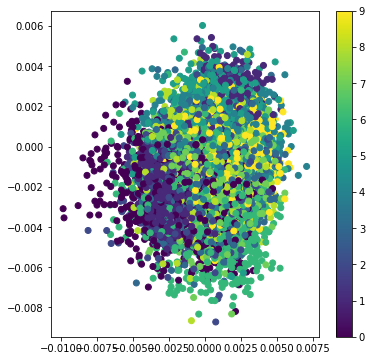

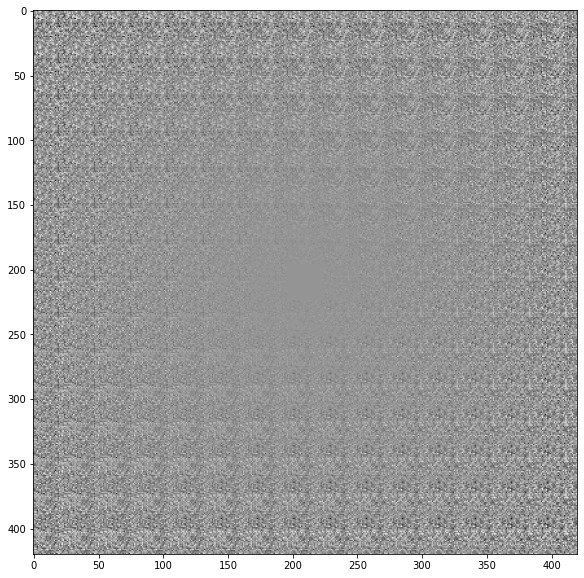

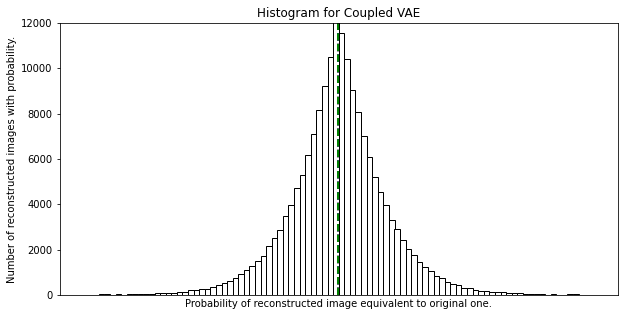

Decisiveness (Arithmetic Mean): -0.6931
Accuracy (Geometric Mean): -0.6932
Robustness (-2/3 Mean): -0.6932

Coupling Distribution: 0, Coupling Loss: 0.025, Seed: 0


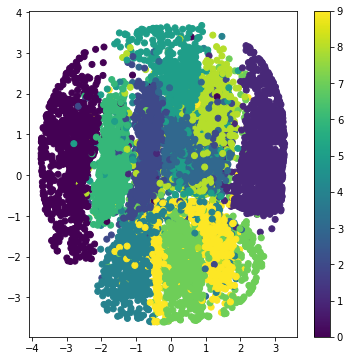

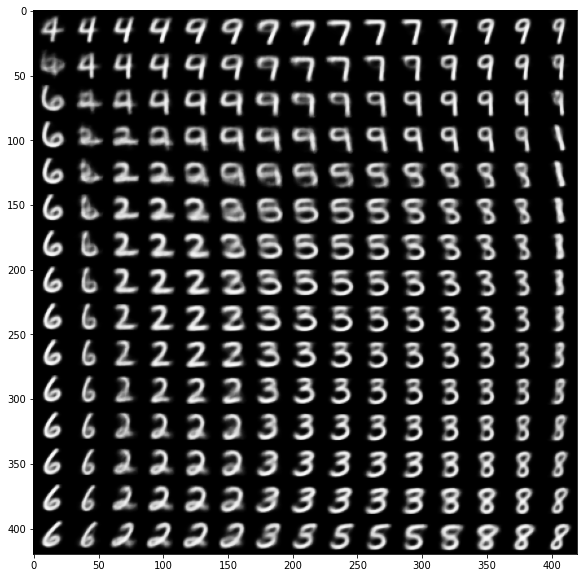

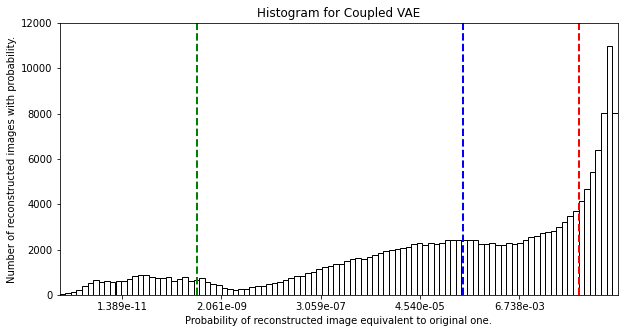

Decisiveness (Arithmetic Mean): -1.9861
Accuracy (Geometric Mean): -7.8459
Robustness (-2/3 Mean): -21.1965

Coupling Distribution: 0, Coupling Loss: 0.05, Seed: 0


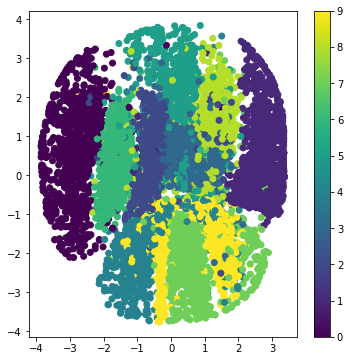

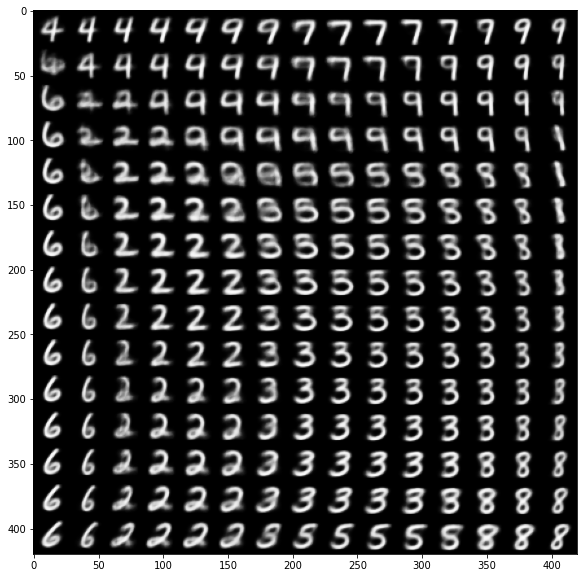

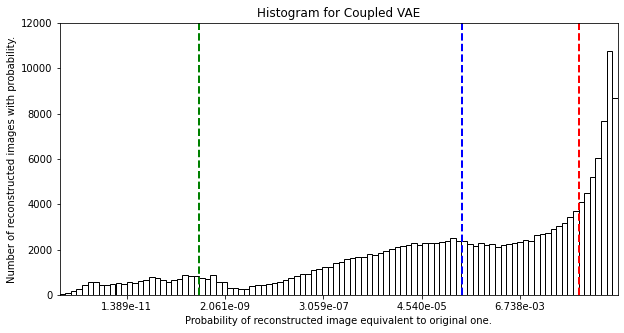

Decisiveness (Arithmetic Mean): -1.9866
Accuracy (Geometric Mean): -7.9518
Robustness (-2/3 Mean): -21.3508

Coupling Distribution: 0, Coupling Loss: 0.075, Seed: 0


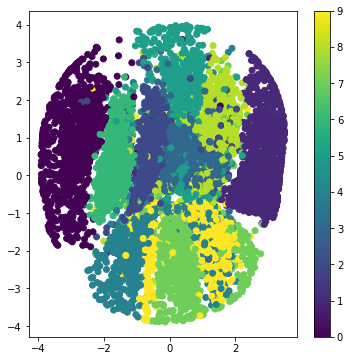

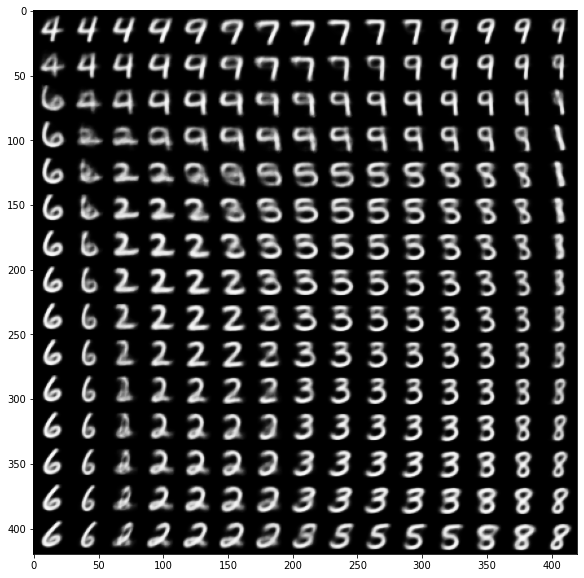

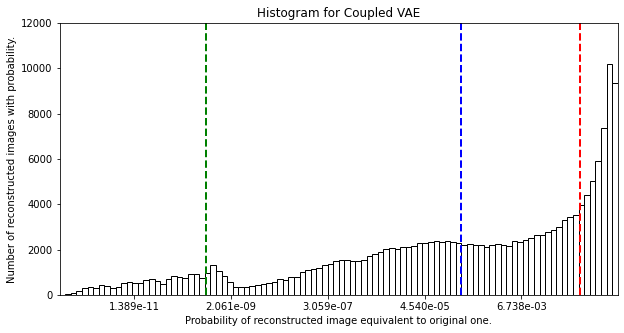

Decisiveness (Arithmetic Mean): -1.9882
Accuracy (Geometric Mean): -8.1245
Robustness (-2/3 Mean): -21.3191

Coupling Distribution: 0, Coupling Loss: 0.1, Seed: 0


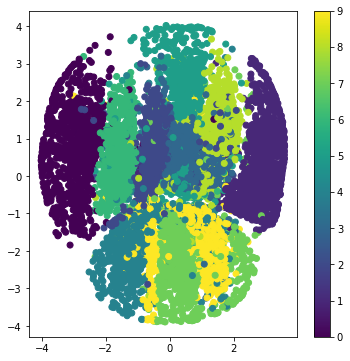

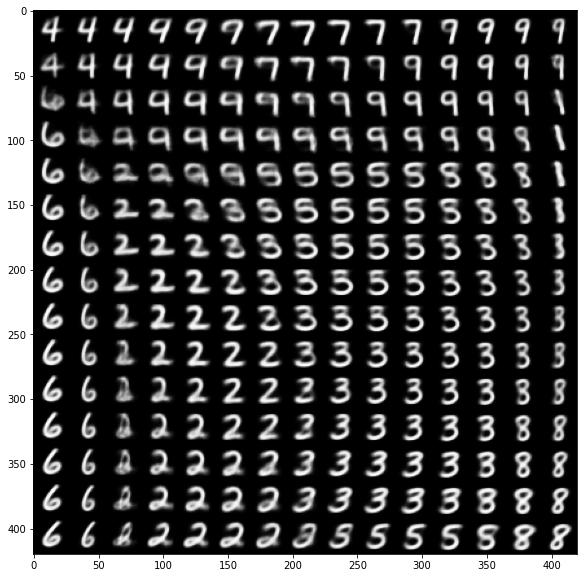

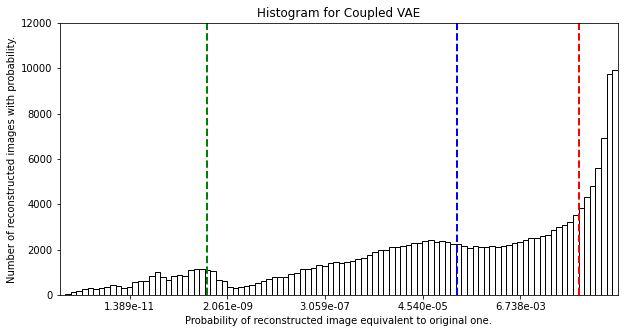

Decisiveness (Arithmetic Mean): -1.9915
Accuracy (Geometric Mean): -8.2545
Robustness (-2/3 Mean): -21.0417

Coupling Distribution: 0, Coupling Loss: 0.15, Seed: 0


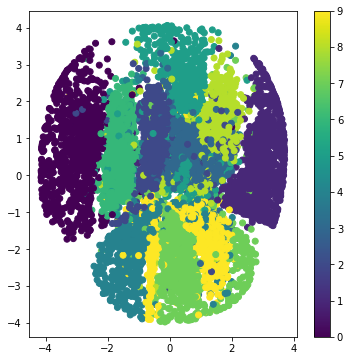

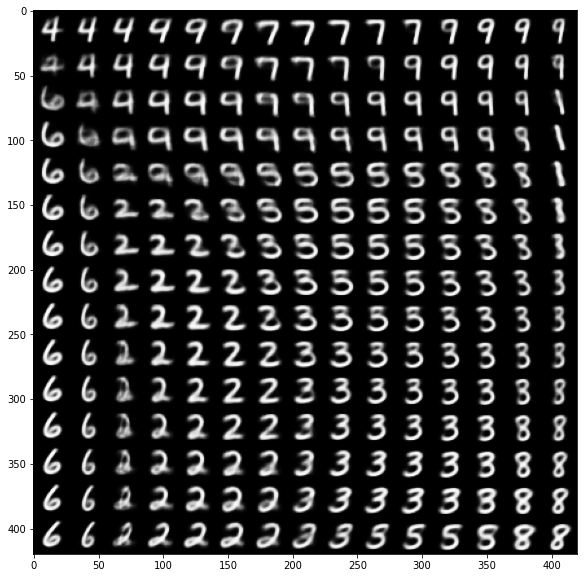

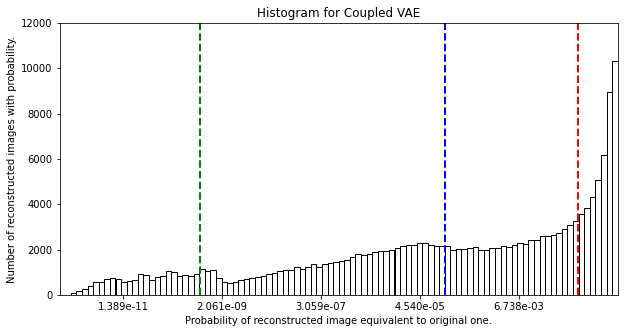

Decisiveness (Arithmetic Mean): -2.0143
Accuracy (Geometric Mean): -8.7306
Robustness (-2/3 Mean): -21.1080

Coupling Distribution: 0, Coupling Loss: 0.2, Seed: 0


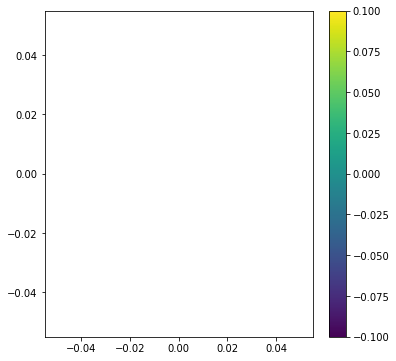

/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.6/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:85: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


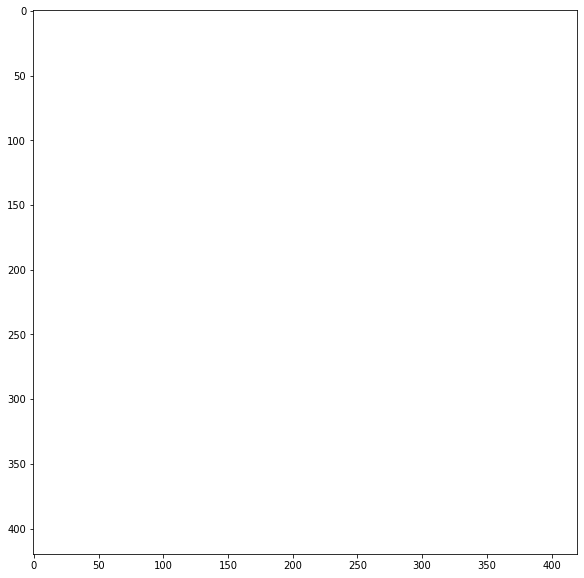

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:6630: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:6631: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0, Coupling Loss: 0.25, Seed: 0


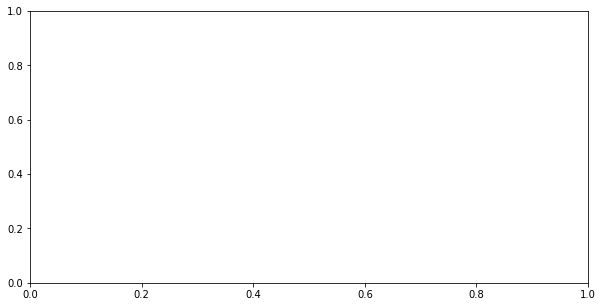

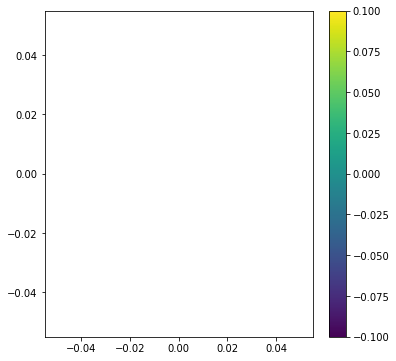

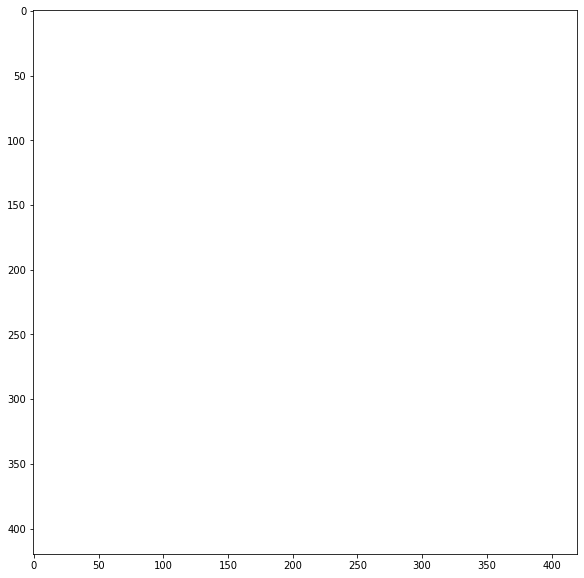

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.0001, Coupling Loss: 0, Seed: 0
Instructions for updating:
Do not pass `graph_parents`.  They will  no longer be used.


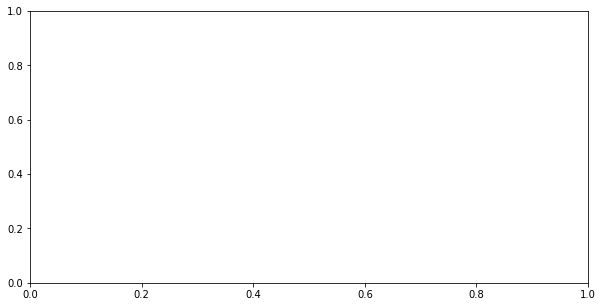

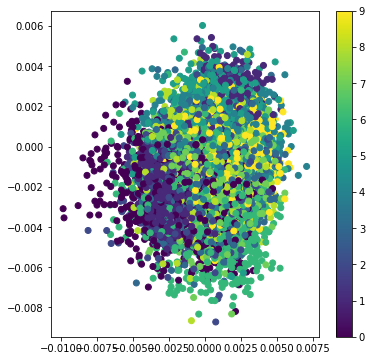

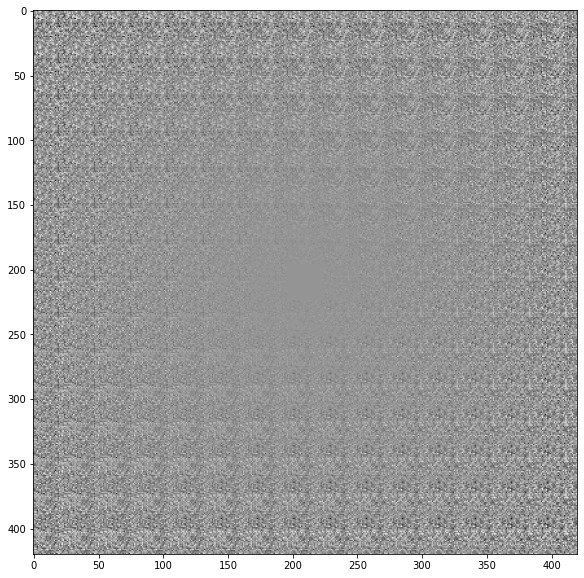

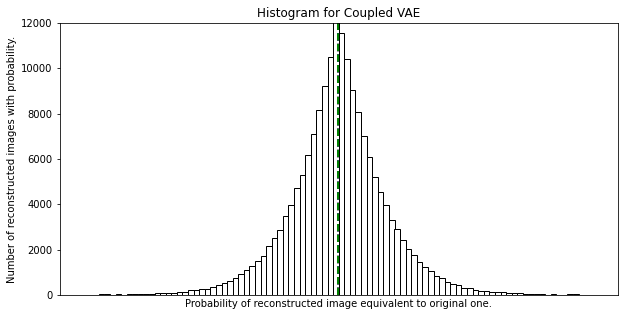

Decisiveness (Arithmetic Mean): -0.6931
Accuracy (Geometric Mean): -0.6932
Robustness (-2/3 Mean): -0.6932

Coupling Distribution: 0.0001, Coupling Loss: 0.025, Seed: 0


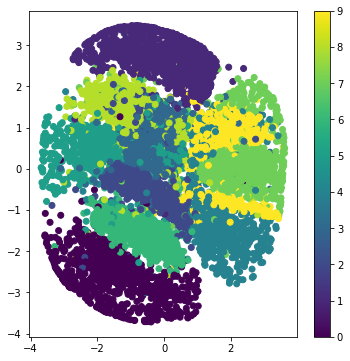

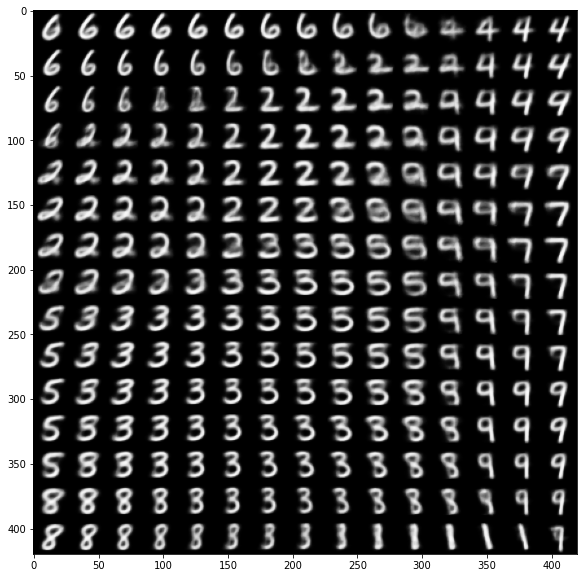

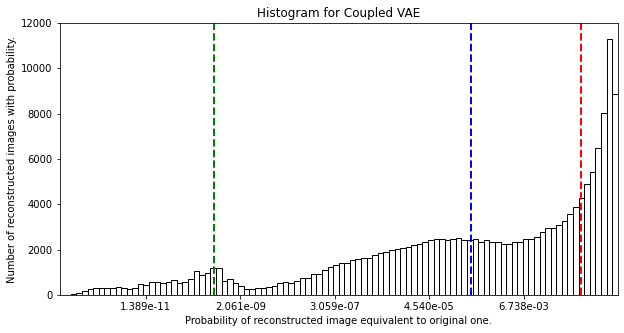

Decisiveness (Arithmetic Mean): -1.9782
Accuracy (Geometric Mean): -7.7754
Robustness (-2/3 Mean): -21.3805

Coupling Distribution: 0.0001, Coupling Loss: 0.05, Seed: 0


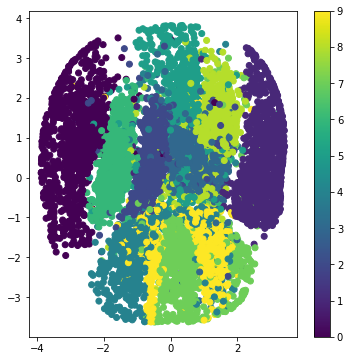

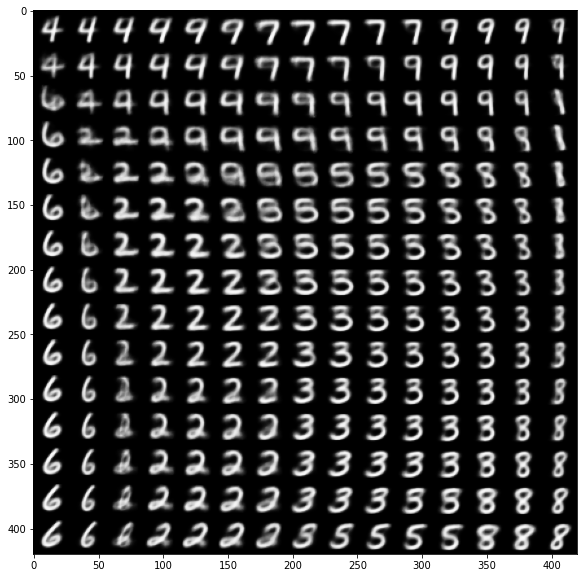

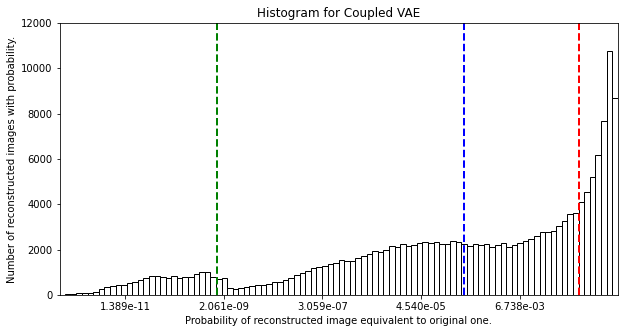

Decisiveness (Arithmetic Mean): -1.9780
Accuracy (Geometric Mean): -7.8427
Robustness (-2/3 Mean): -20.3288

Coupling Distribution: 0.0001, Coupling Loss: 0.075, Seed: 0


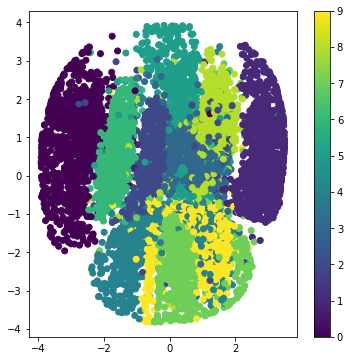

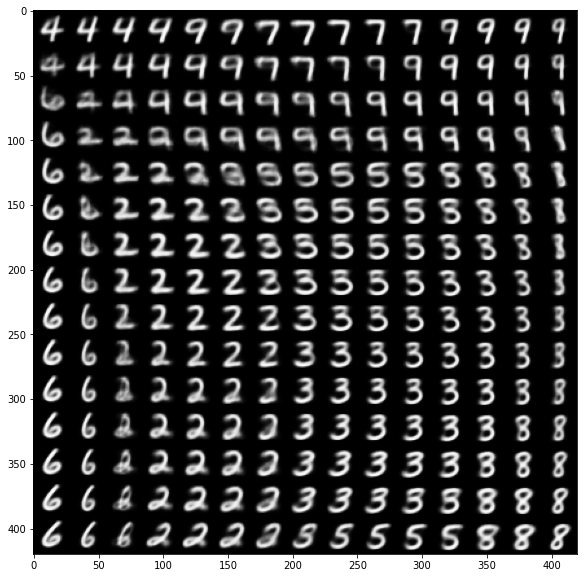

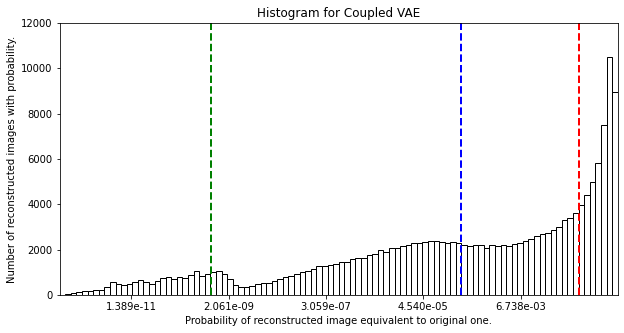

Decisiveness (Arithmetic Mean): -1.9852
Accuracy (Geometric Mean): -8.0758
Robustness (-2/3 Mean): -20.8878

Coupling Distribution: 0.0001, Coupling Loss: 0.1, Seed: 0


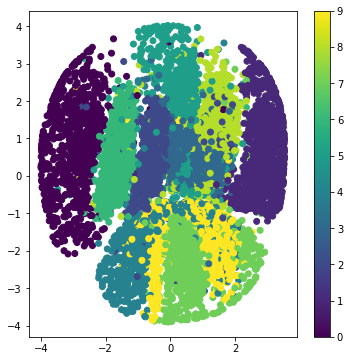

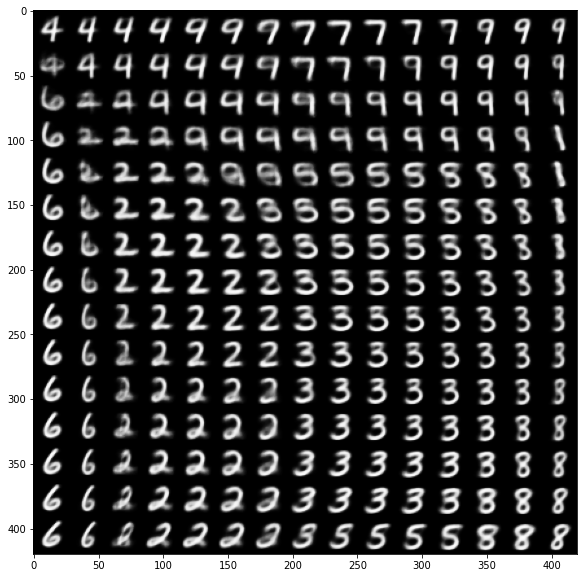

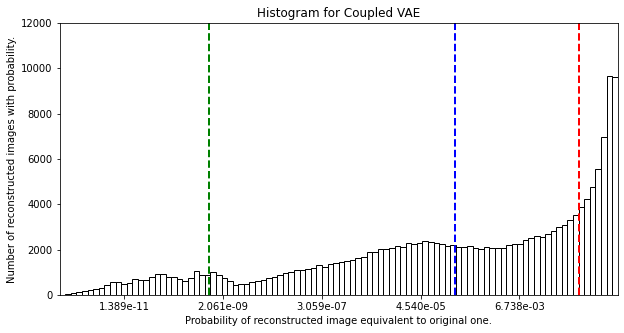

Decisiveness (Arithmetic Mean): -1.9978
Accuracy (Geometric Mean): -8.2410
Robustness (-2/3 Mean): -20.6949

Coupling Distribution: 0.0001, Coupling Loss: 0.15, Seed: 0


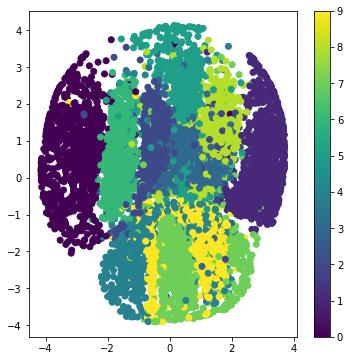

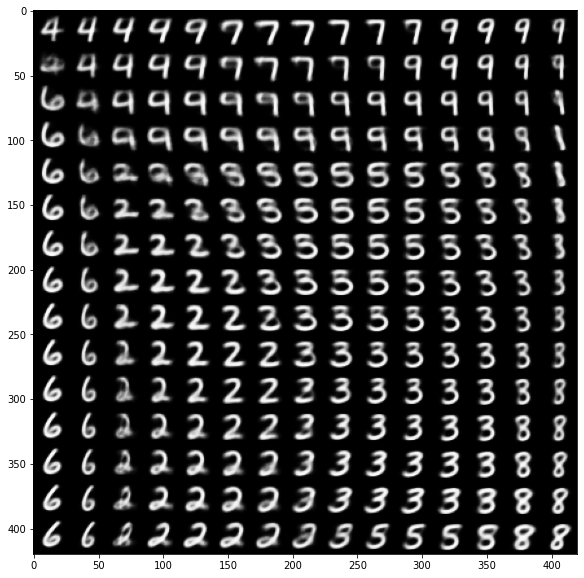

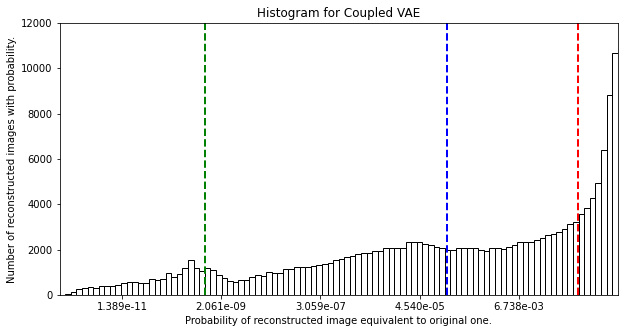

Decisiveness (Arithmetic Mean): -2.0024
Accuracy (Geometric Mean): -8.6079
Robustness (-2/3 Mean): -20.7874

Coupling Distribution: 0.0001, Coupling Loss: 0.2, Seed: 0


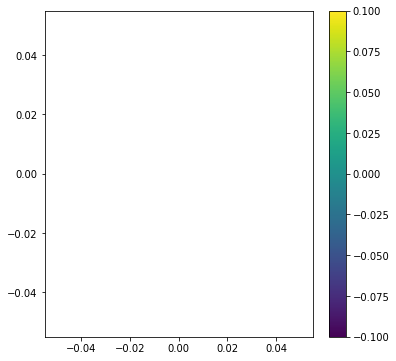

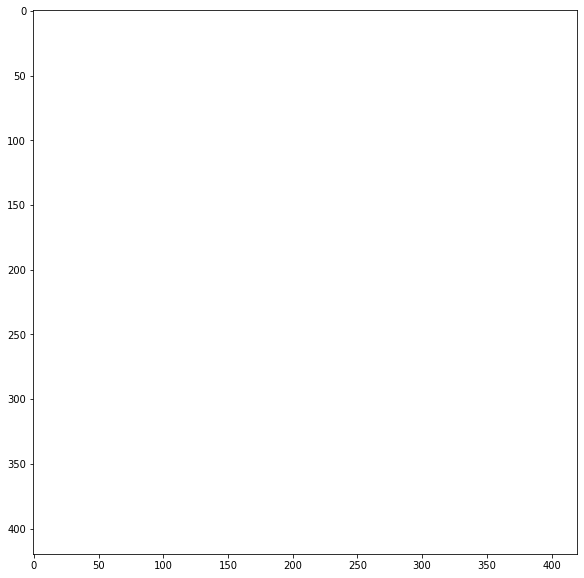

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.0001, Coupling Loss: 0.25, Seed: 0


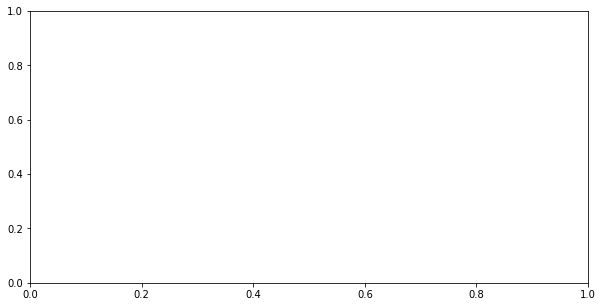

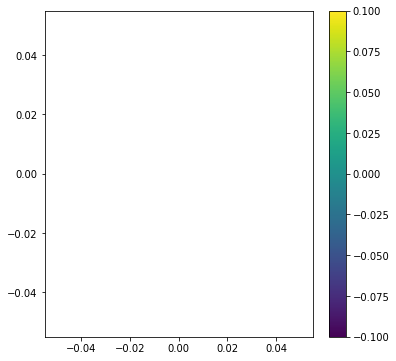

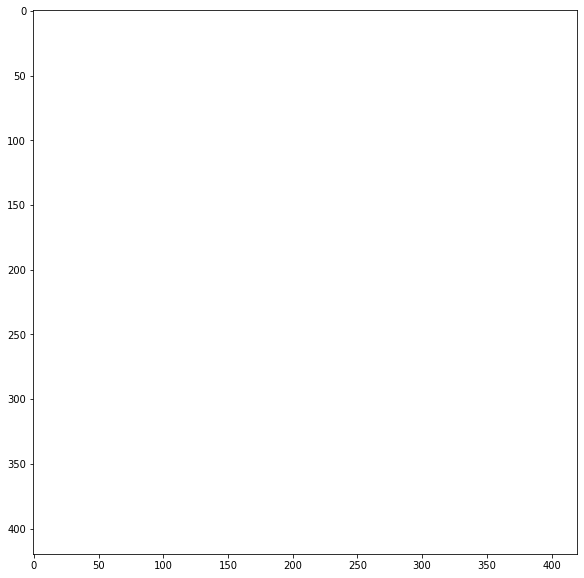

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.001, Coupling Loss: 0, Seed: 0


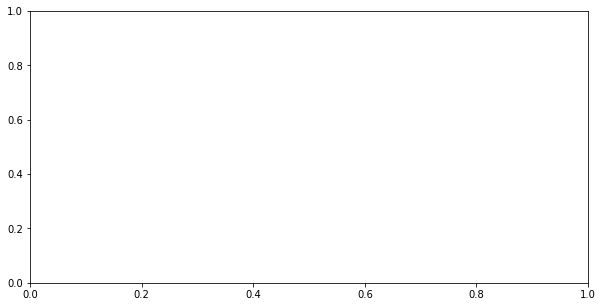

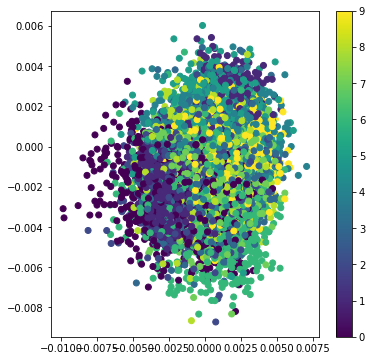

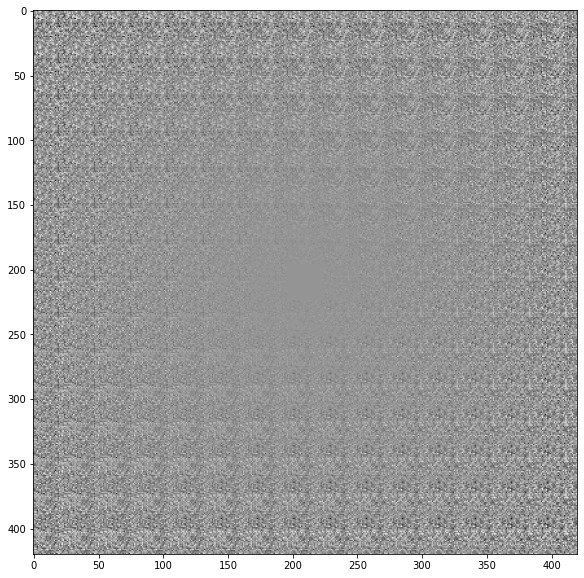

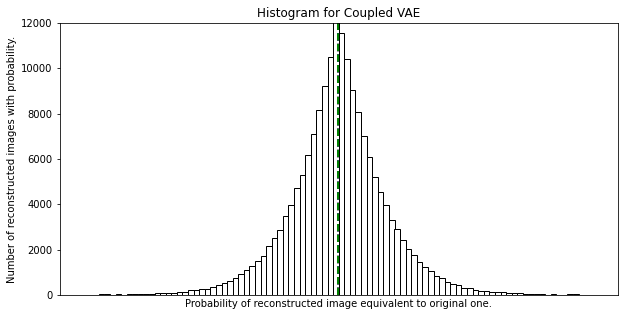

Decisiveness (Arithmetic Mean): -0.6931
Accuracy (Geometric Mean): -0.6932
Robustness (-2/3 Mean): -0.6932

Coupling Distribution: 0.001, Coupling Loss: 0.025, Seed: 0


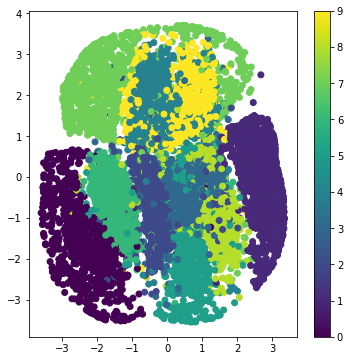

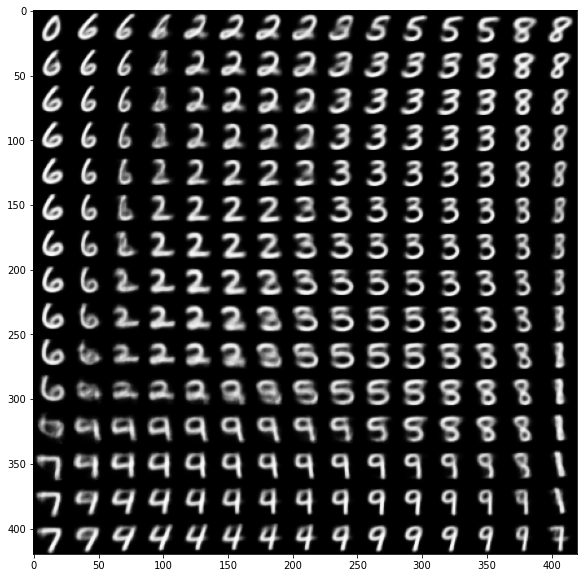

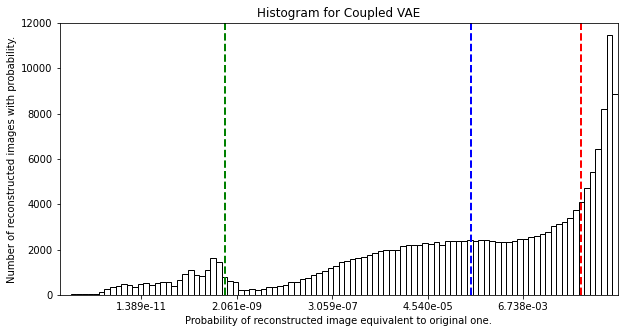

Decisiveness (Arithmetic Mean): -1.9655
Accuracy (Geometric Mean): -7.7269
Robustness (-2/3 Mean): -20.6289

Coupling Distribution: 0.001, Coupling Loss: 0.05, Seed: 0


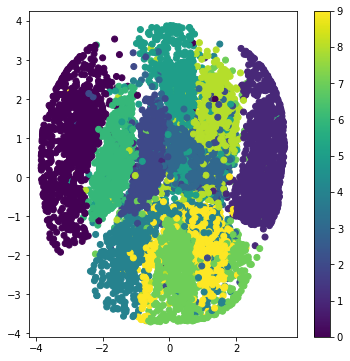

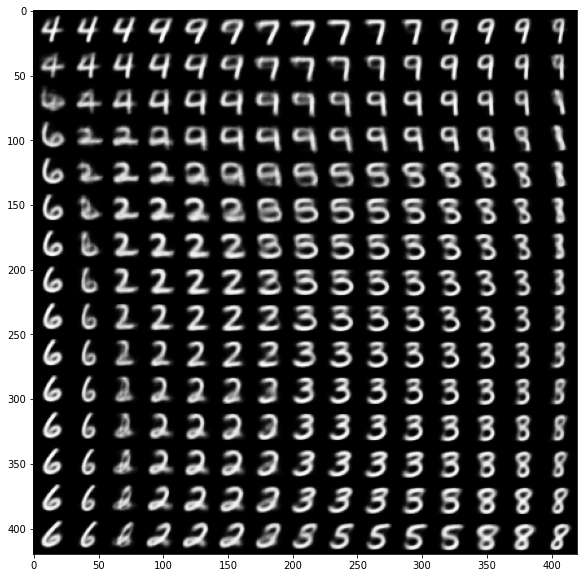

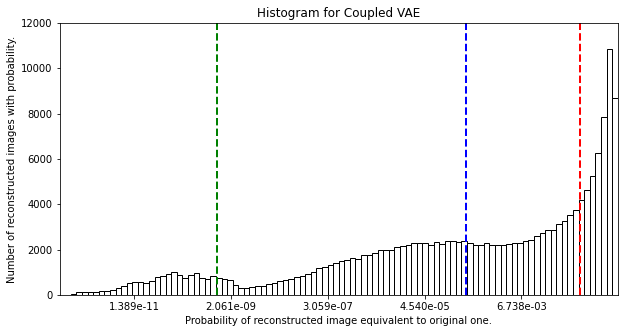

Decisiveness (Arithmetic Mean): -1.9810
Accuracy (Geometric Mean): -7.8679
Robustness (-2/3 Mean): -20.7013

Coupling Distribution: 0.001, Coupling Loss: 0.075, Seed: 0


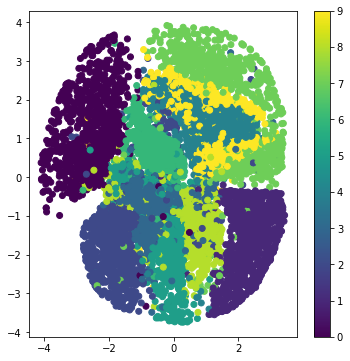

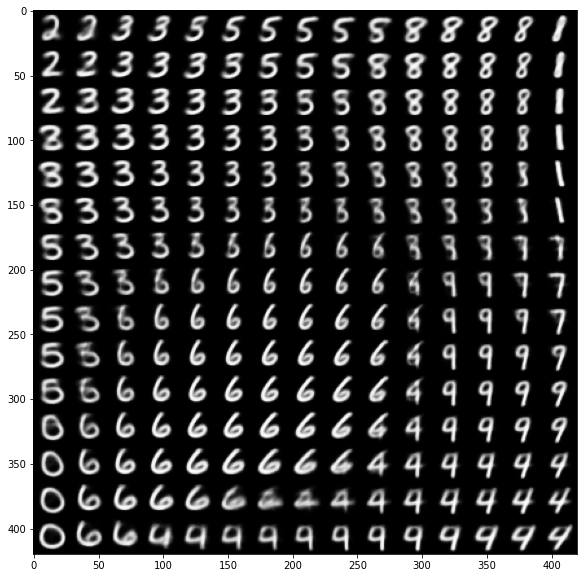

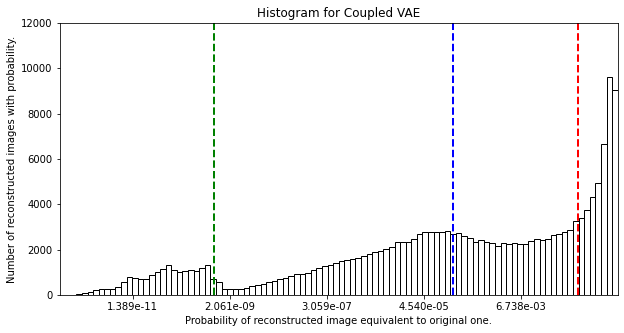

Decisiveness (Arithmetic Mean): -2.0660
Accuracy (Geometric Mean): -8.5269
Robustness (-2/3 Mean): -20.8156

Coupling Distribution: 0.001, Coupling Loss: 0.1, Seed: 0


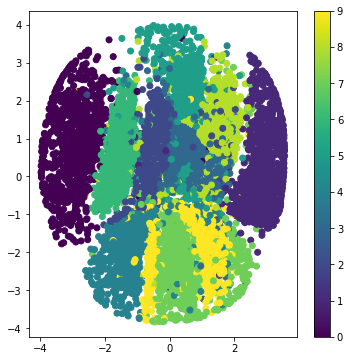

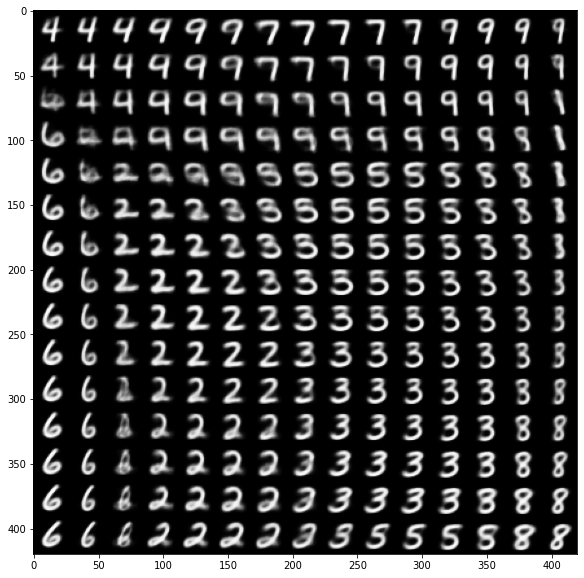

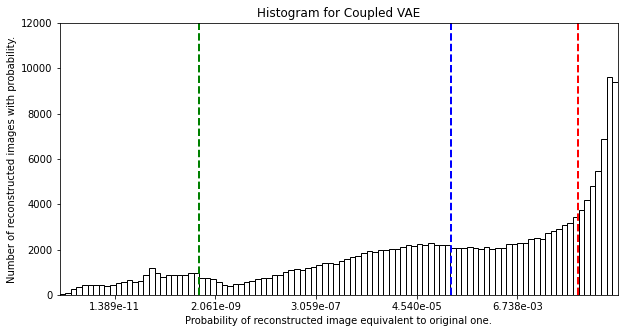

Decisiveness (Arithmetic Mean): -1.9978
Accuracy (Geometric Mean): -8.2926
Robustness (-2/3 Mean): -20.7897

Coupling Distribution: 0.001, Coupling Loss: 0.15, Seed: 0


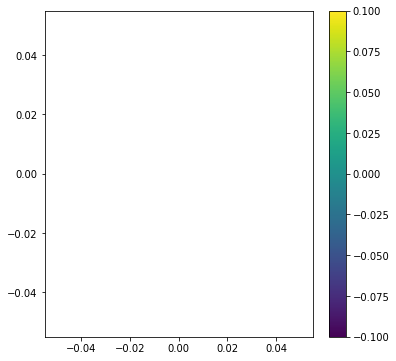

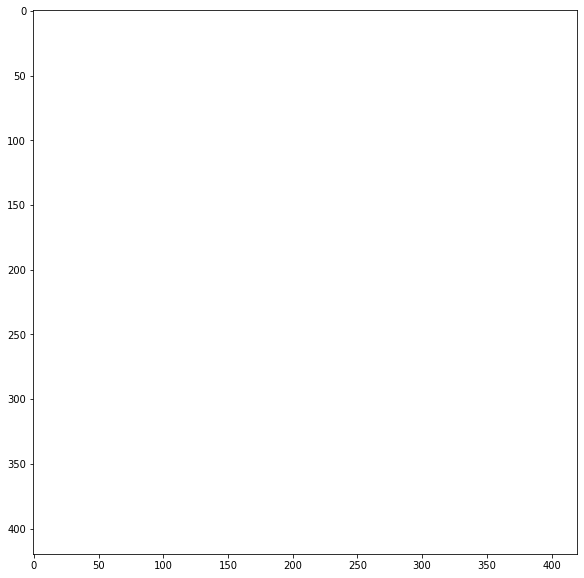

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.001, Coupling Loss: 0.2, Seed: 0


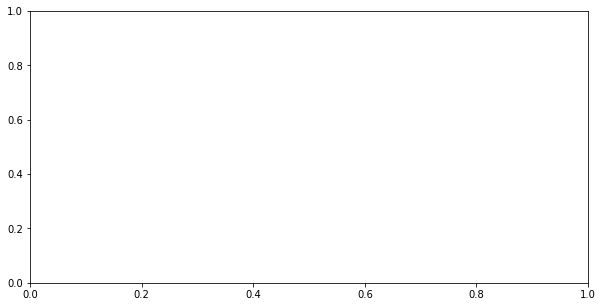

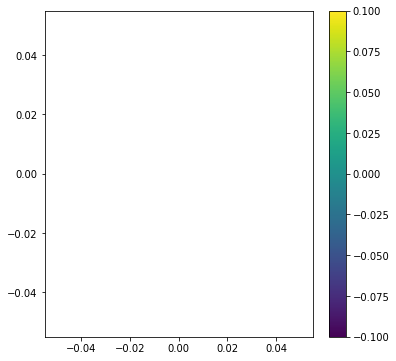

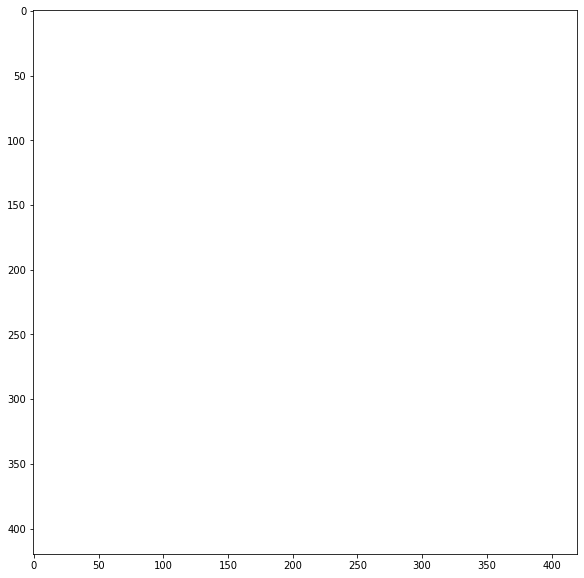

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.001, Coupling Loss: 0.25, Seed: 0


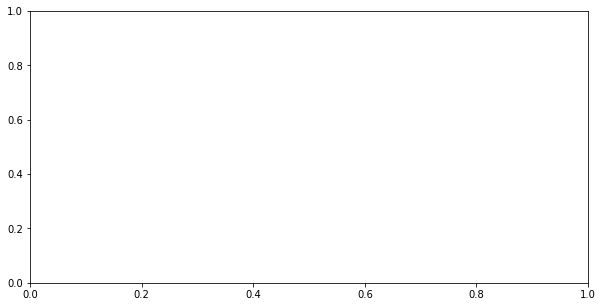

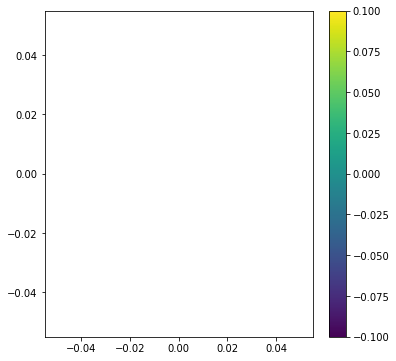

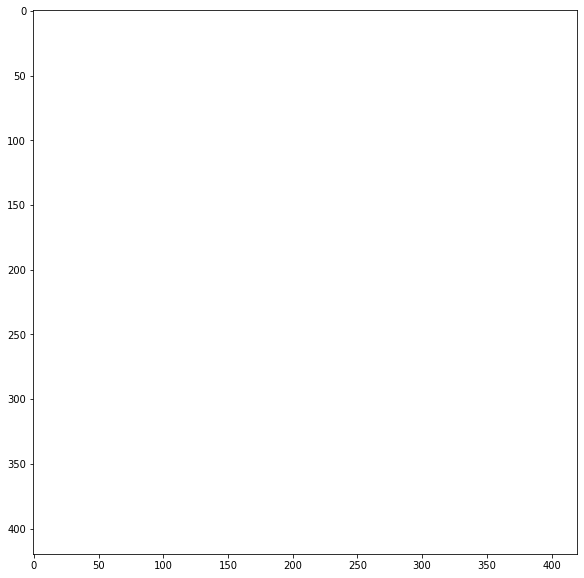

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.01, Coupling Loss: 0, Seed: 0


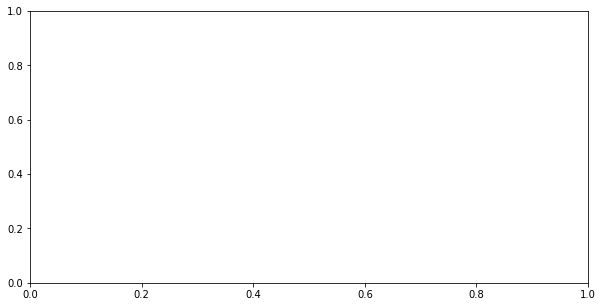

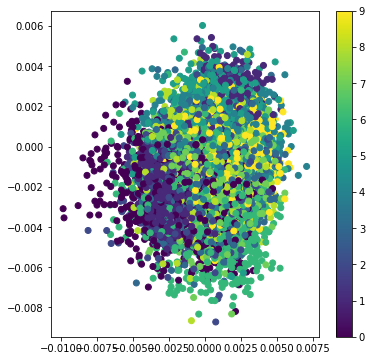

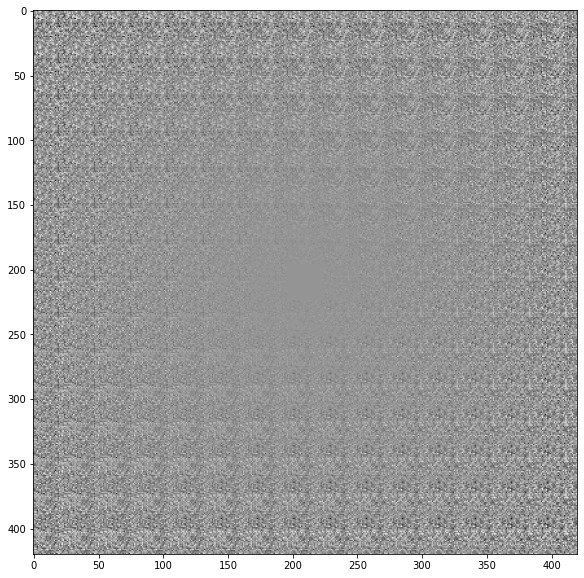

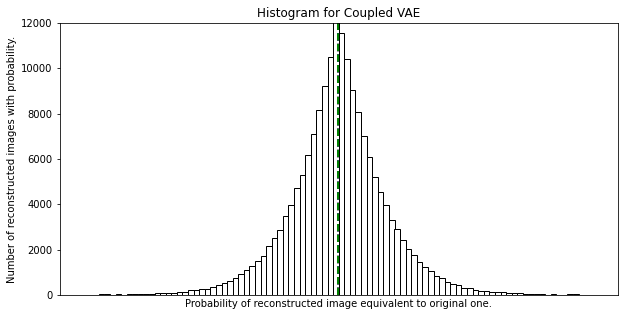

Decisiveness (Arithmetic Mean): -0.6931
Accuracy (Geometric Mean): -0.6932
Robustness (-2/3 Mean): -0.6932

Coupling Distribution: 0.01, Coupling Loss: 0.025, Seed: 0


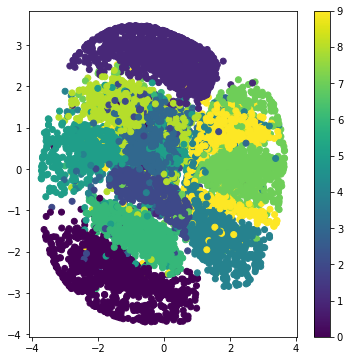

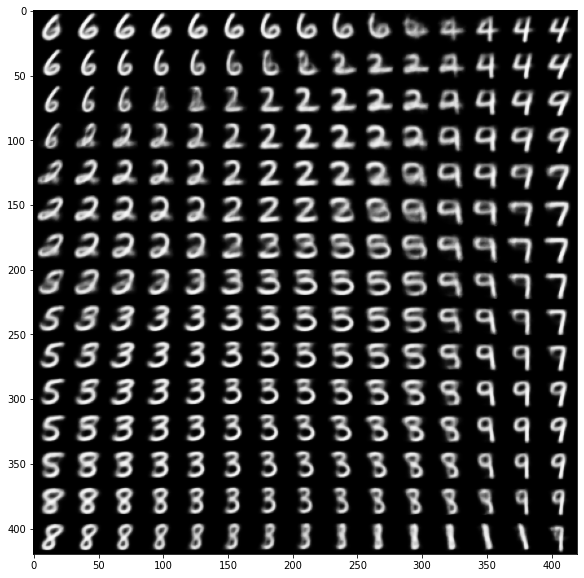

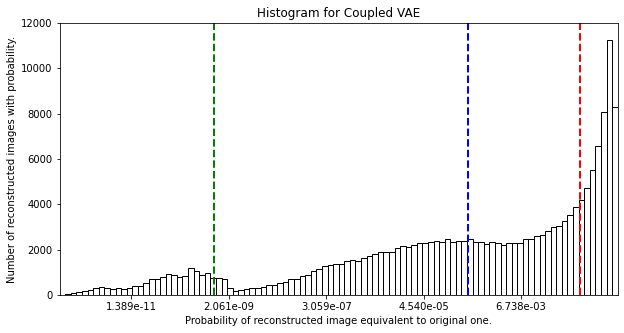

Decisiveness (Arithmetic Mean): -1.9769
Accuracy (Geometric Mean): -7.7120
Robustness (-2/3 Mean): -20.7508

Coupling Distribution: 0.01, Coupling Loss: 0.05, Seed: 0


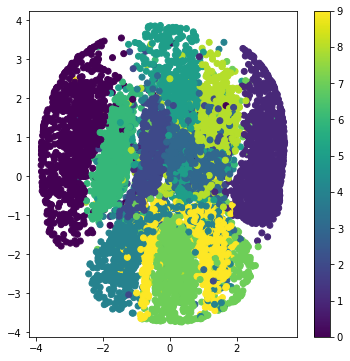

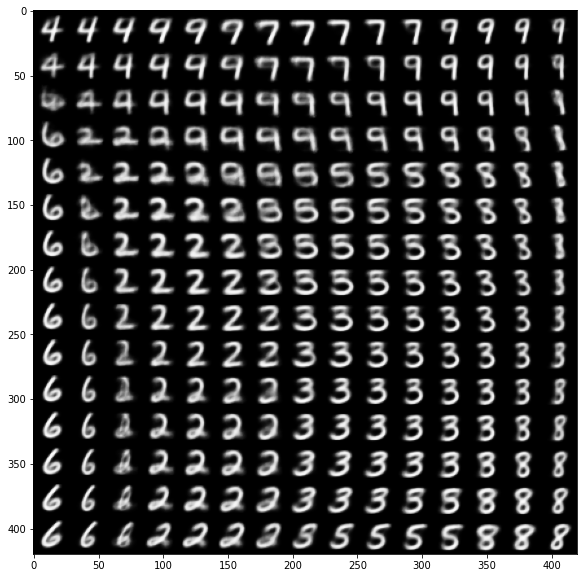

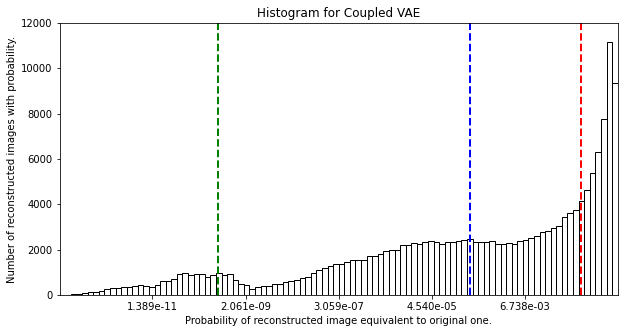

Decisiveness (Arithmetic Mean): -1.9775
Accuracy (Geometric Mean): -7.9592
Robustness (-2/3 Mean): -21.4665

Coupling Distribution: 0.01, Coupling Loss: 0.075, Seed: 0


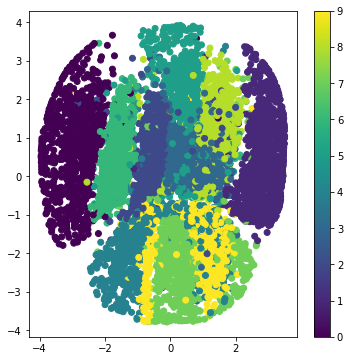

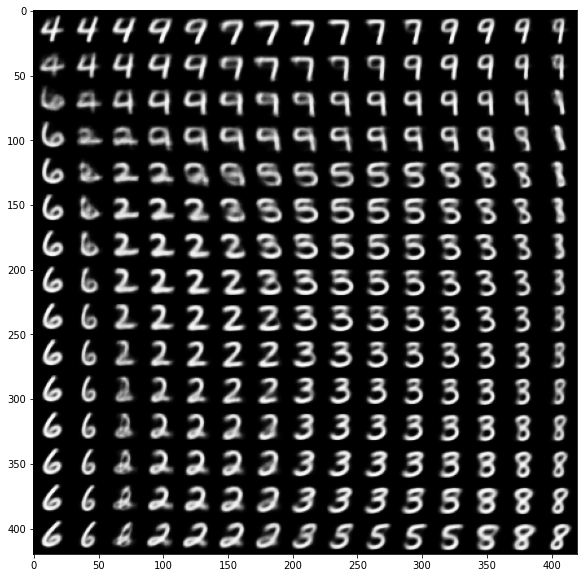

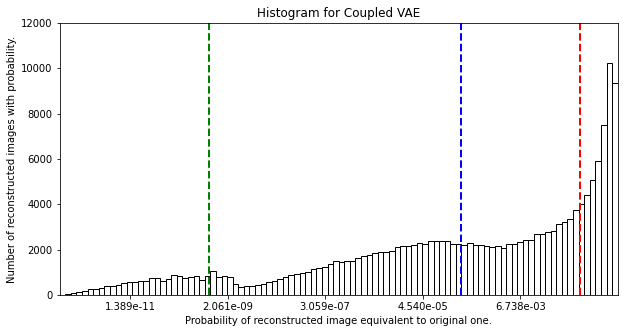

Decisiveness (Arithmetic Mean): -1.9761
Accuracy (Geometric Mean): -8.0235
Robustness (-2/3 Mean): -20.9623

Coupling Distribution: 0.01, Coupling Loss: 0.1, Seed: 0


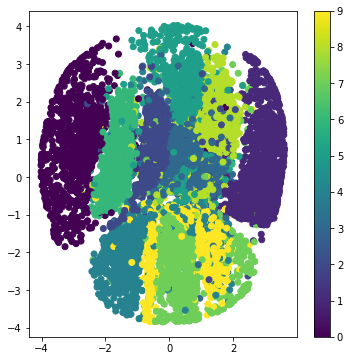

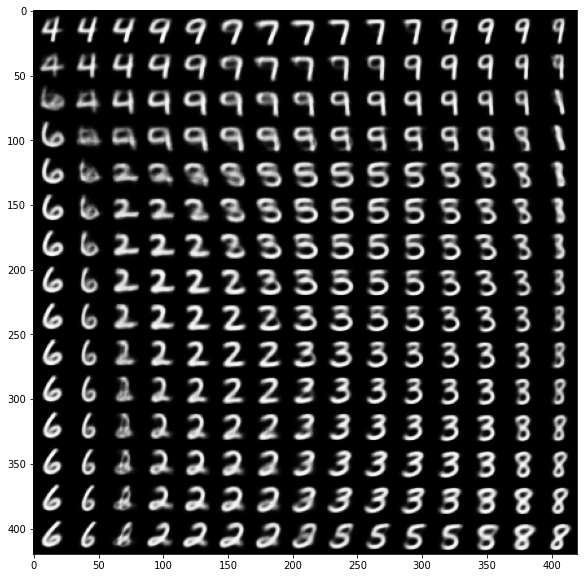

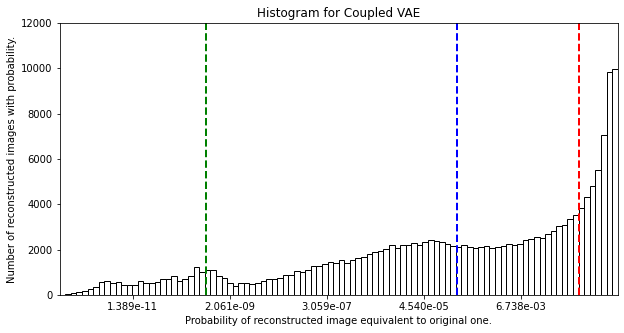

Decisiveness (Arithmetic Mean): -1.9897
Accuracy (Geometric Mean): -8.2825
Robustness (-2/3 Mean): -21.2332

Coupling Distribution: 0.01, Coupling Loss: 0.15, Seed: 0


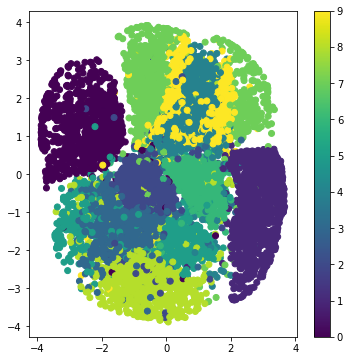

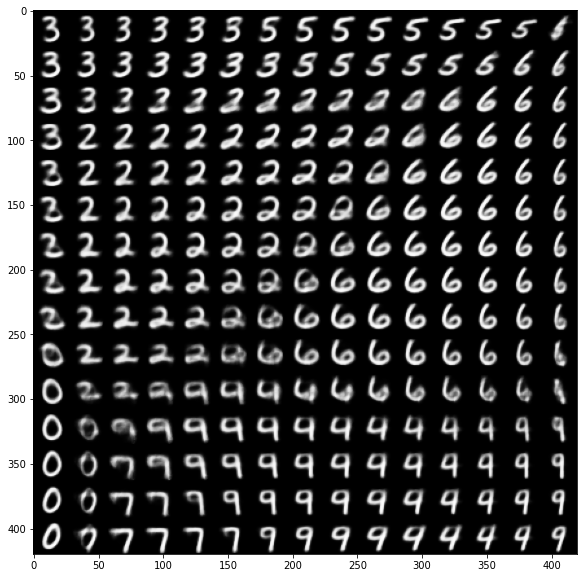

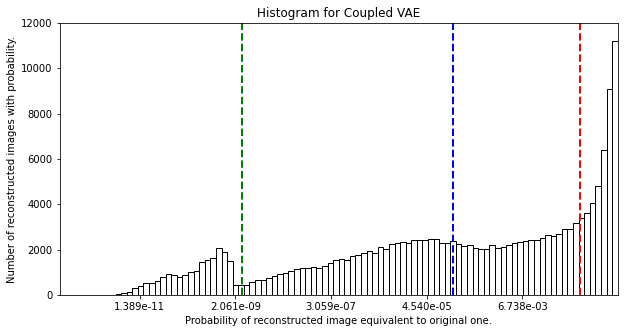

Decisiveness (Arithmetic Mean): -2.0160
Accuracy (Geometric Mean): -8.6265
Robustness (-2/3 Mean): -19.6533

Coupling Distribution: 0.01, Coupling Loss: 0.2, Seed: 0


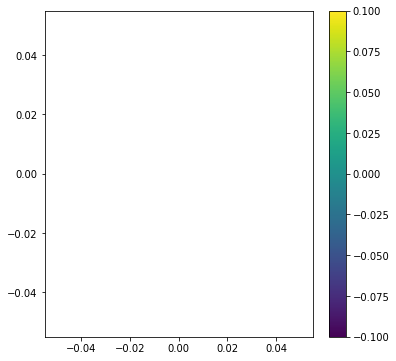

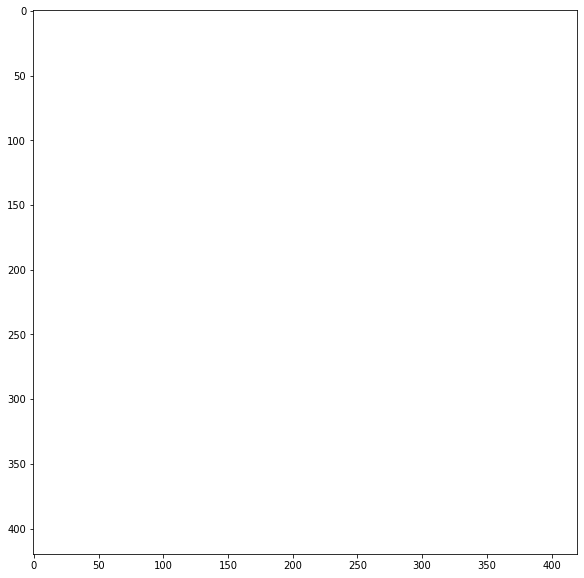

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

Coupling Distribution: 0.01, Coupling Loss: 0.25, Seed: 0


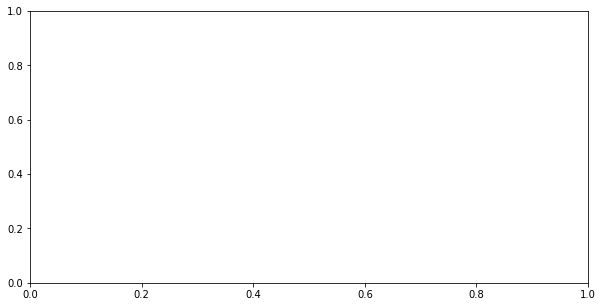

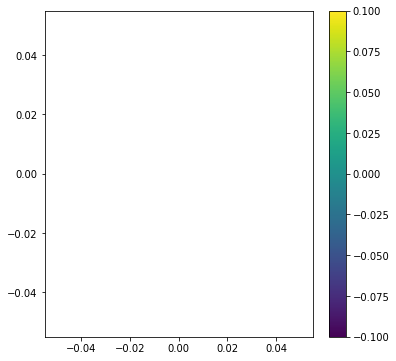

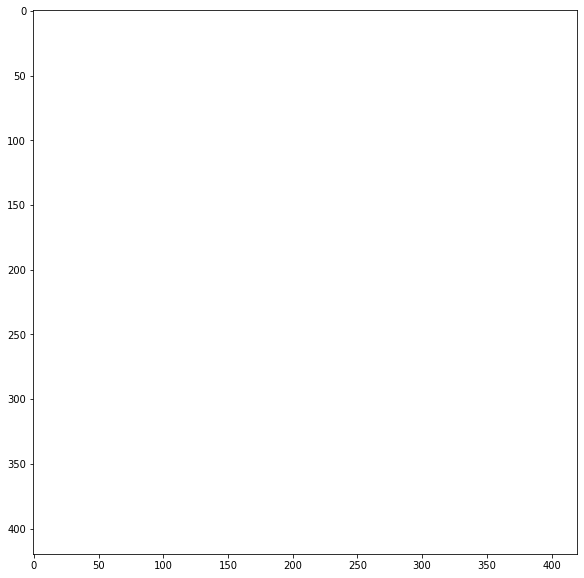

Failed to retrieve generalized mean values due to ValueError, thus set to NaN.

CPU times: user 4h 30min 58s, sys: 52min 41s, total: 5h 23min 39s
Wall time: 3h 10min 49s


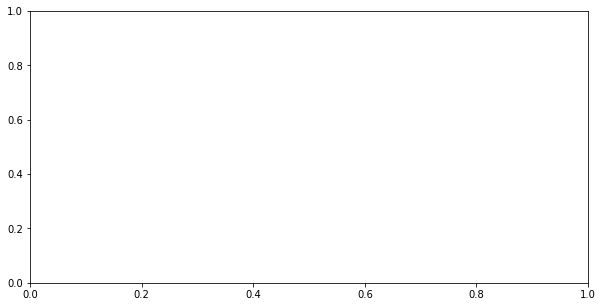

In [9]:
%%time
comparison = run_cvae_loop(X_train, X_test, y_test, coupling_dist_list, coupling_loss_list, seed_list,
                           n_epoch=n_epoch, learning_rate=learning_rate, verbose=verbose
                           )

In [10]:
for seed in seed_list:
    print(comparison[seed])

    coupling_dist  coupling_loss  ...  log_accuracy  log_robustness
0          0.0000          0.000  ...     -0.693155       -0.693159
1          0.0000          0.025  ...     -7.845885      -21.196521
2          0.0000          0.050  ...     -7.951772      -21.350792
3          0.0000          0.075  ...     -8.124506      -21.319082
4          0.0000          0.100  ...     -8.254465      -21.041721
5          0.0000          0.150  ...     -8.730605      -21.107984
6          0.0000          0.200  ...           NaN             NaN
7          0.0000          0.250  ...           NaN             NaN
8          0.0001          0.000  ...     -0.693155       -0.693159
9          0.0001          0.025  ...     -7.775423      -21.380490
10         0.0001          0.050  ...     -7.842734      -20.328782
11         0.0001          0.075  ...     -8.075843      -20.887813
12         0.0001          0.100  ...     -8.241025      -20.694876
13         0.0001          0.150  ...     -8.607